<a href="https://colab.research.google.com/github/EJamdar05/cs276-project/blob/main/CS276_Project_Ukraine_Graph.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
import pandas as pd
import networkx as nx
import matplotlib.pyplot as plt

df = pd.read_csv('data/clean_data/output.csv')
df.head()

,tweet_id,lang,country,verified,sentiment_neutral,entail_prob,contra_prob,stance,region
0,1540451336876986373,cs,Slovakia,True,0.5044,0.30,0.70,unsure,Europe
1,1516696238212661253,ro,Italy,False,0.9146,0.18,0.82,unsure,Europe
2,1587766197298548738,te,India,True,0.5799,0.31,0.69,unsure,Asia
3,1586193152175529984,te,India,True,0.0000,0.03,0.97,unsure,Asia
4,1580452730212331520,te,India,True,0.0000,0.33,0.67,pro-Ukraine,Asia


In [2]:
row_count = len(df)
print(f"Number of rows: {row_count}")

Number of rows: 646573


In [3]:
B = nx.Graph()

stances = df["stance"].unique()
countries = df["country"].unique()
regions = df["region"].unique()

print(stances)
print(countries)
print(regions)

['unsure' 'pro-Ukraine' 'pro-Russia']
['Slovakia' 'Italy' 'India' 'Czech Republic' 'France' 'Ukraine' 'Nepal'
 'Japan' 'United States of America' 'Azerbaijan' 'South Africa'
 'South Korea' 'Latvia' 'Saudi Arabia' 'United Arab Emirates' 'Turkey'
 'Qatar' 'Israel' 'Egypt' 'Lebanon' 'State of Palestine'
 "People's Republic of China" 'Germany' 'Algeria' 'Morocco' 'Tunisia'
 'Iraq' 'United Kingdom' 'Syria' 'Iran' 'Libya' 'Bahrain' 'Kuwait'
 'Australia' 'Nigeria' 'Singapore' 'Pakistan' 'Canada' 'Malaysia'
 'Philippines' 'Afghanistan' 'Argentina' 'Portugal' 'Brazil' 'Chile'
 'Mexico' 'Spain' 'Bulgaria' 'Slovenia' 'Finland' 'Thailand' 'Denmark'
 'Norway' 'Tuvalu' 'Sweden' 'Lithuania' 'Romania' 'Bangladesh' 'Greece'
 'Cyprus' 'Russia' 'Kazakhstan' 'Belarus' 'Poland' 'Hungary' 'Switzerland'
 'Austria' 'Luxembourg' 'Republic of Ireland' 'Netherlands' 'Belgium'
 'Senegal' 'Indonesia' 'Haiti' 'Monaco' 'Cuba' 'Colombia' 'Venezuela'
 'Nicaragua' 'Guatemala' 'Peru' 'Honduras' 'Ecuador' 'Panama' 'Boliv

In [4]:
B.add_nodes_from(stances, bipartite='stance')
B.add_nodes_from(countries, bipartite='country')
B.add_nodes_from(regions, bipartite='region')

edge_counts = {}

for index, row in df.iterrows():
    stance = row['stance']
    country = row['country']
    # Count occurrences of each edge
    edge_key = (stance, country)
    if edge_key in edge_counts:
        edge_counts[edge_key] += 1
    else:
        edge_counts[edge_key] = 1
    
    # Add or update edge with count as weight
    B.add_edge(stance, country, 
               weight=edge_counts[edge_key],  # This is the key part for Louvain
               tweet_id=row['tweet_id'], 
               entail_prob=row["entail_prob"], 
               contra_prob=row["contra_prob"])

In [5]:
# Connect countries to their regions
for index, row in df.iterrows():
    # Add edge between country and its region if it doesn't exist already
    if not B.has_edge(row['country'], row['region']):
        B.add_edge(row['country'], row['region'])

# For visualization, you'll need a custom layout since bipartite_layout only works for two groups
# Let's create a three-layer layout
stance_nodes = [node for node, attr in B.nodes(data=True) if attr['bipartite'] == 'stance']
country_nodes = [node for node, attr in B.nodes(data=True) if attr['bipartite'] == 'country']
region_nodes = [node for node, attr in B.nodes(data=True) if attr['bipartite'] == 'region']



In [6]:
# Print Graph info
print(f"Graph Information:")
print(f"Total nodes: {B.number_of_nodes()}")
print(f"Total edges: {B.number_of_edges()}")
print(f"Node types:")
print(f"  - Stance nodes: {len(stance_nodes)}")
print(f"  - Country nodes: {len(country_nodes)}")
print(f"  - Region nodes: {len(region_nodes)}")

Graph Information:
Total nodes: 125
Total edges: 406
Node types:
  - Stance nodes: 3
  - Country nodes: 115
  - Region nodes: 7


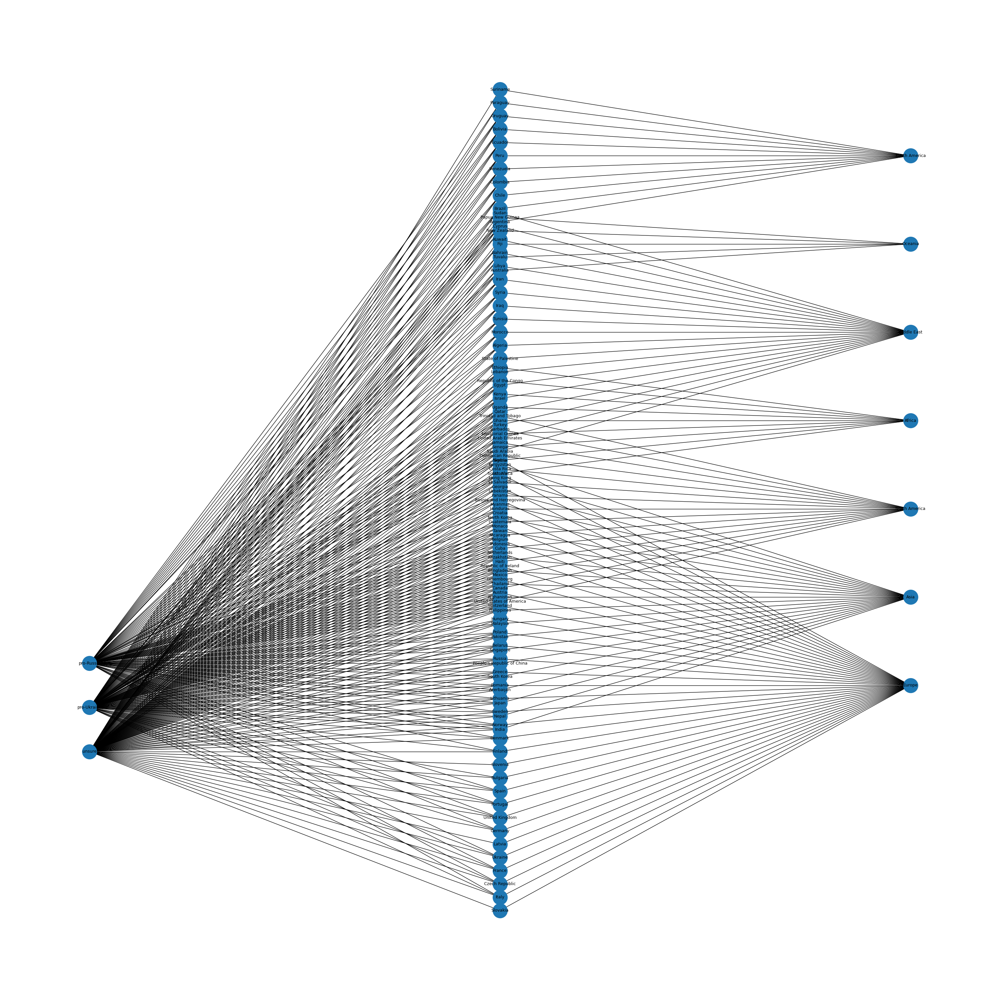

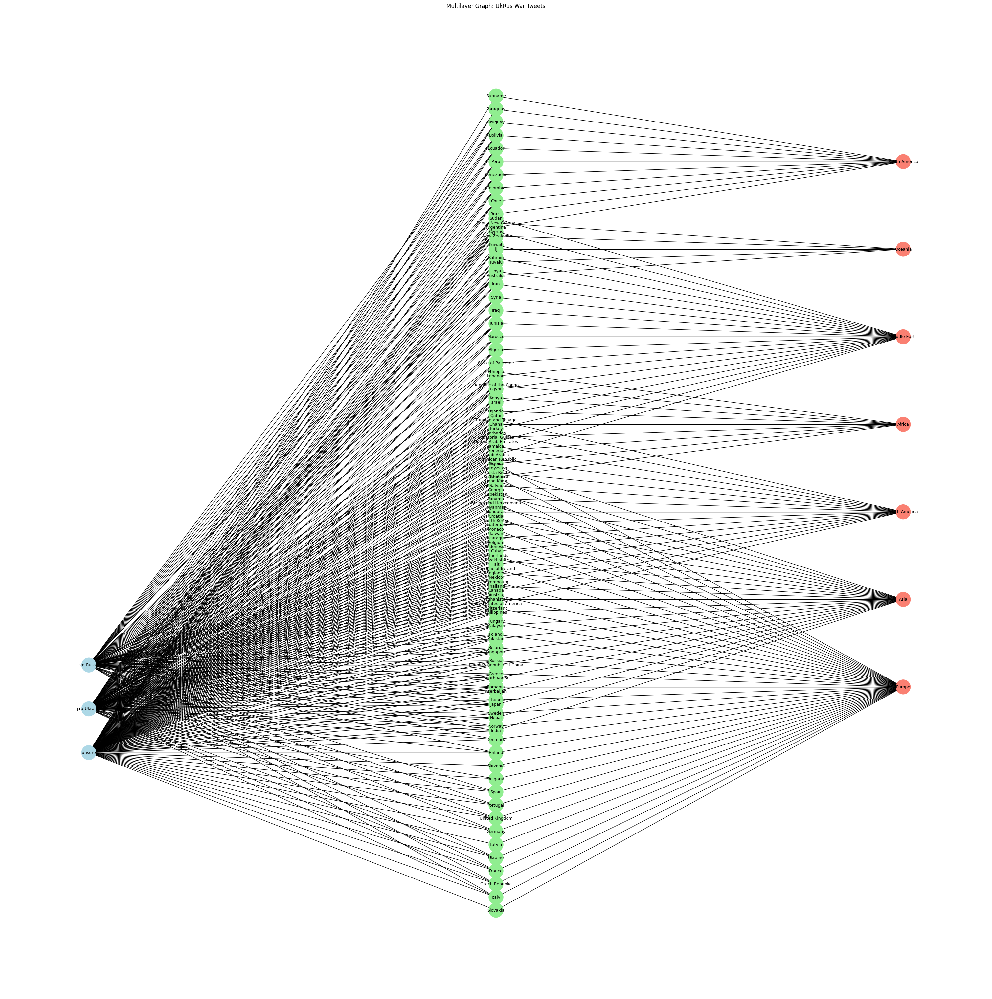

In [7]:
# Create position dictionary
pos = {}

# Position stances on the left
for i, node in enumerate(stance_nodes):
    pos[node] = (-1, i - len(stance_nodes)/2)

# Group countries by region
countries_by_region = {}
for region in regions:
    countries_by_region[region] = []

# Populate the dictionary with countries for each region
for index, row in df.iterrows():
    country = row['country']
    region = row['region']
    if country not in countries_by_region[region]:
        countries_by_region[region].append(country)

# Position regions on the right and their countries aligned with them
region_spacing = 2.0  # Vertical spacing between regions
country_spacing = 0.3  # Vertical spacing between countries in same region

current_y = 0
for i, region in enumerate(region_nodes):
    # Position for the region
    region_y = current_y
    pos[region] = (1, region_y)
    
    # Position countries belonging to this region
    countries = countries_by_region[region]
    start_y = region_y - (len(countries) - 1) * country_spacing / 2
    
    for j, country in enumerate(countries):
        country_y = start_y + j * country_spacing
        pos[country] = (0, country_y)
    
    # Update current_y for next region
    current_y += region_spacing

# Draw the graph with the new layout
plt.figure(figsize=(30, 30))
nx.draw(B, pos, with_labels=True, node_size=1000, font_size=9)

# Add node colors by type
node_colors = []
for node in B.nodes():
    attr = B.nodes[node]['bipartite']
    if attr == 'stance':
        node_colors.append('lightblue')
    elif attr == 'country':
        node_colors.append('lightgreen')
    else:  # region
        node_colors.append('salmon')

plt.figure(figsize=(30, 30))
nx.draw(B, pos, with_labels=True, node_size=1000, font_size=9, node_color=node_colors)
plt.title("Multilayer Graph: UkRus War Tweets")
plt.savefig("data/Clean_Data/multilayer_graph.png")
plt.show()

In [8]:
nx.write_edgelist(B, "data/clean_data/region_stances_per_country.edgelist")

In [9]:
import numpy as np
from node2vec import Node2Vec

# Generate node embeddings using node2vec
node2vec = Node2Vec(B, dimensions=64, walk_length=30, num_walks=200, workers=4)
model = node2vec.fit(window=10, min_count=1)

# Get embeddings for all nodes
node_embeddings = {}
for node in B.nodes():
    node_embeddings[node] = model.wv[node]

# Convert to a dataframe for easier use in ML
embedding_df = pd.DataFrame.from_dict(node_embeddings, orient='index')

# Add node type as a feature
embedding_df['node_type'] = [B.nodes[node]['bipartite'] for node in embedding_df.index]

# Save embeddings
embedding_df.to_csv('data/Clean_Data/node_embeddings.csv')

Computing transition probabilities:   0%|          | 0/125 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████| 50/50 [00:00<00:00, 97.80it/s]


In [10]:
features = {}
for node in B.nodes():
    node_type = B.nodes[node]['bipartite']
    
    # Basic features
    degree = B.degree(node)
    neighbors = list(B.neighbors(node))
    
    # Calculate different features based on node type
    if node_type == 'stance':
        # For stance nodes, count connections to each region
        region_connections = {}
        for region in regions:
            region_connections[region] = 0
        
        for country in neighbors:
            if B.nodes[country]['bipartite'] == 'country':
                for neighbor_of_country in B.neighbors(country):
                    if B.nodes[neighbor_of_country]['bipartite'] == 'region':
                        region_connections[neighbor_of_country] += 1
                        
        features[node] = {
            'node_type': node_type,
            'degree': degree,
            'region_connections': region_connections
        }
        
    elif node_type == 'country':
        # For country nodes, get its region and stance connections
        country_region = None
        for neighbor in neighbors:
            if B.nodes[neighbor]['bipartite'] == 'region':
                country_region = neighbor
                break
                
        stance_connections = {}
        for stance in stances:
            stance_connections[stance] = 0
            
        for neighbor in neighbors:
            if B.nodes[neighbor]['bipartite'] == 'stance':
                stance_connections[neighbor] += 1
                
        features[node] = {
            'node_type': node_type,
            'degree': degree,
            'region': country_region,
            'stance_connections': stance_connections
        }
        
    else:  # region node
        # For region nodes, count countries in the region
        countries_in_region = [n for n in neighbors if B.nodes[n]['bipartite'] == 'country']
        
        features[node] = {
            'node_type': node_type,
            'degree': degree,
            'country_count': len(countries_in_region)
        }

In [11]:
print(features)

{'unsure': {'node_type': 'stance', 'degree': 115, 'region_connections': {'Europe': 35, 'Asia': 21, 'North America': 15, 'Africa': 9, 'Middle East': 19, 'Oceania': 5, 'South America': 11}}, 'pro-Ukraine': {'node_type': 'stance', 'degree': 99, 'region_connections': {'Europe': 30, 'Asia': 17, 'North America': 14, 'Africa': 7, 'Middle East': 17, 'Oceania': 4, 'South America': 10}}, 'pro-Russia': {'node_type': 'stance', 'degree': 77, 'region_connections': {'Europe': 24, 'Asia': 16, 'North America': 8, 'Africa': 4, 'Middle East': 15, 'Oceania': 1, 'South America': 9}}, 'Slovakia': {'node_type': 'country', 'degree': 2, 'region': 'Europe', 'stance_connections': {'unsure': 1, 'pro-Ukraine': 0, 'pro-Russia': 0}}, 'Italy': {'node_type': 'country', 'degree': 4, 'region': 'Europe', 'stance_connections': {'unsure': 1, 'pro-Ukraine': 1, 'pro-Russia': 1}}, 'India': {'node_type': 'country', 'degree': 4, 'region': 'Asia', 'stance_connections': {'unsure': 1, 'pro-Ukraine': 1, 'pro-Russia': 1}}, 'Czech Re

In [12]:
feature_rows = []
for index, row in df.iterrows():
    stance = row['stance']
    country = row['country']
    region = row['region']
    
    # Get tweet-specific features
    tweet_features = {
        'tweet_id': row['tweet_id'],
        'stance': stance,
        'country': country,
        'region': region,
        'entail_prob': row['entail_prob'],
        'contra_prob': row['contra_prob']
    }
    
    # Add graph-based features
    tweet_features['stance_degree'] = B.degree(stance)
    tweet_features['country_degree'] = B.degree(country)
    
    # Get number of tweets from same country with each stance
    country_stances = {}
    for s in stances:
        if B.has_edge(s, country):
            # Count the number of tweets with this stance-country combination
            edge_data = B.get_edge_data(s, country)
            if isinstance(edge_data, dict) and 'tweet_id' in edge_data:
                country_stances[s] = 1  # Single tweet case
            else:
                country_stances[s] = len(edge_data)  # Multiple tweets case
        else:
            country_stances[s] = 0
    
    # Add these as features
    for s, count in country_stances.items():
        tweet_features[f'country_{country}_stance_{s}_count'] = count
    
    feature_rows.append(tweet_features)

# Convert to DataFrame
features_df = pd.DataFrame(feature_rows)

# One-hot encode categorical variables
features_df_encoded = pd.get_dummies(features_df, columns=['stance', 'country', 'region'])

# Normalize numerical features
from sklearn.preprocessing import StandardScaler
numerical_cols = ['entail_prob', 'contra_prob', 'stance_degree', 'country_degree']
scaler = StandardScaler()
features_df_encoded[numerical_cols] = scaler.fit_transform(features_df_encoded[numerical_cols])

# Save to CSV for ML
features_df_encoded.to_csv('data/Clean_Data/graph_ml_features.csv', index=False)

In [13]:
#!pip install python-louvain

Detected 6 communities
Community 0: 59 nodes (1 stances, 58 countries, 0 regions)
  Stances: ['unsure']
  Countries: ['Lebanon', 'Spain', 'Malaysia', 'Brazil', 'Kenya', 'United States of America', 'Jamaica', 'Denmark', 'Hong Kong', 'Kyrgyzstan', 'Slovakia', 'Nepal', 'Uganda', 'Saudi Arabia', 'Ukraine', 'Hungary', 'Lithuania', 'Portugal', 'Syria', 'Nigeria', 'Uzbekistan', 'Greece', 'Netherlands', 'Finland', 'Thailand', 'Tunisia', 'Pakistan', 'Japan', 'Romania', 'Israel', 'Belarus', 'Ghana', 'Azerbaijan', 'Afghanistan', 'Kazakhstan', 'Bulgaria', 'Russia', 'Algeria', 'Bangladesh', 'Turkey', 'Morocco', 'Indonesia', "People's Republic of China", 'Norway', 'Sweden', 'United Arab Emirates', 'Serbia', 'Latvia', 'Bosnia and Herzegovina', 'Bahrain', 'Chile', 'Czech Republic', 'South Korea', 'Egypt', 'Cyprus', 'Iraq', 'Libya', 'State of Palestine']
  Regions: []

Community 1: 50 nodes (2 stances, 45 countries, 3 regions)
  Stances: ['pro-Russia', 'pro-Ukraine']
  Countries: ['Austria', 'Poland', 

/var/folders/_l/1kr2qnhx75791zdfn85rfby80000gn/T/ipykernel_255/2368192285.py:89: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap = cm.get_cmap('viridis', num_communities)


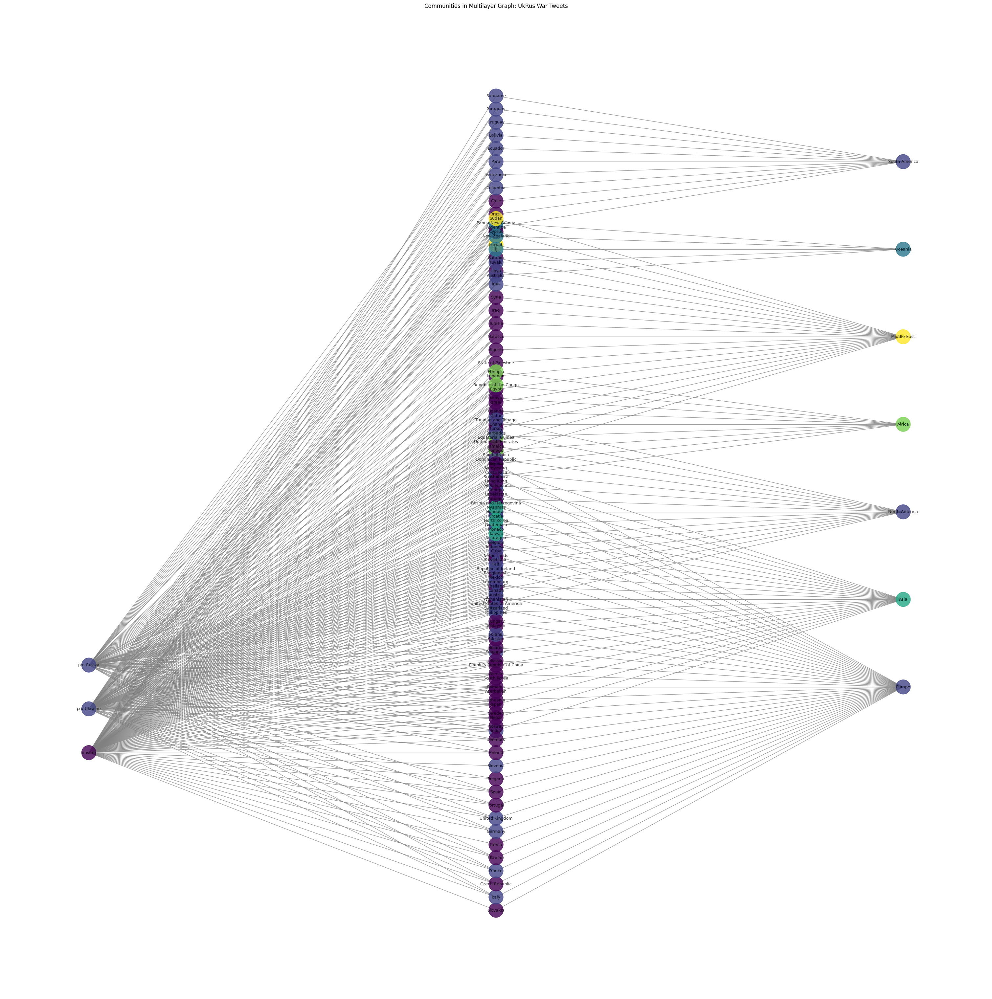

Community composition analysis:
------------------------------
Community 0:
  Homogeneity: 0.98 (country dominated)
  Stances in this community connect to 115 countries
  Region homogeneity: 0.34 (countries mostly from Europe)

Community 1:
  Homogeneity: 0.90 (country dominated)
  Stances in this community connect to 99 countries
  Region homogeneity: 0.33 (countries mostly from Europe)

Community 2:
  Homogeneity: 0.75 (country dominated)
  Region homogeneity: 1.00 (countries mostly from Oceania)

Community 3:
  Homogeneity: 0.75 (country dominated)
  Region homogeneity: 1.00 (countries mostly from Asia)

Community 4:
  Homogeneity: 0.80 (country dominated)
  Region homogeneity: 1.00 (countries mostly from Africa)

Community 5:
  Homogeneity: 0.67 (country dominated)
  Region homogeneity: 1.00 (countries mostly from Middle East)



In [14]:
import networkx as nx
import matplotlib.pyplot as plt
import matplotlib.cm as cm
import numpy as np

# Apply Louvain community detection using NetworkX
communities = nx.algorithms.community.louvain_communities(B)

# Convert communities to a partition dictionary
partition = {}
for i, community in enumerate(communities):
    for node in community:
        partition[node] = i

# Get number of communities
num_communities = len(communities)
print(f"Detected {num_communities} communities")

# Create a dictionary to store nodes in each community
communities_dict = {}
for i, community in enumerate(communities):
    communities_dict[i] = list(community)

# Print communities and their composition
for community_id, nodes in communities_dict.items():
    # Count node types in this community
    stance_count = sum(1 for node in nodes if B.nodes[node]['bipartite'] == 'stance')
    country_count = sum(1 for node in nodes if B.nodes[node]['bipartite'] == 'country')
    region_count = sum(1 for node in nodes if B.nodes[node]['bipartite'] == 'region')
    
    print(f"Community {community_id}: {len(nodes)} nodes ({stance_count} stances, {country_count} countries, {region_count} regions)")
    
    # Print the nodes in each category
    print("  Stances:", [node for node in nodes if B.nodes[node]['bipartite'] == 'stance'])
    print("  Countries:", [node for node in nodes if B.nodes[node]['bipartite'] == 'country'])
    print("  Regions:", [node for node in nodes if B.nodes[node]['bipartite'] == 'region'])
    print()

# Visualize the graph with communities
plt.figure(figsize=(30, 30))

# Generate layout
stance_nodes = [node for node, attr in B.nodes(data=True) if attr['bipartite'] == 'stance']
country_nodes = [node for node, attr in B.nodes(data=True) if attr['bipartite'] == 'country']
region_nodes = [node for node, attr in B.nodes(data=True) if attr['bipartite'] == 'region']

# Create position dictionary
pos = {}

# Position stances on the left
for i, node in enumerate(stance_nodes):
    pos[node] = (-1, i - len(stance_nodes)/2)

# Group countries by region
countries_by_region = {}
for region in regions:
    countries_by_region[region] = []

# Populate the dictionary with countries for each region
for index, row in df.iterrows():
    country = row['country']
    region = row['region']
    if country not in countries_by_region[region]:
        countries_by_region[region].append(country)

# Position regions on the right and their countries aligned with them
region_spacing = 2.0  # Vertical spacing between regions
country_spacing = 0.3  # Vertical spacing between countries in same region

current_y = 0
for i, region in enumerate(region_nodes):
    # Position for the region
    region_y = current_y
    pos[region] = (1, region_y)
    
    # Position countries belonging to this region
    countries = countries_by_region[region]
    start_y = region_y - (len(countries) - 1) * country_spacing / 2
    
    for j, country in enumerate(countries):
        country_y = start_y + j * country_spacing
        pos[country] = (0, country_y)
    
    # Update current_y for next region
    current_y += region_spacing

# Use a color map to color nodes by community
cmap = cm.get_cmap('viridis', num_communities)
node_colors = [cmap(partition[node]) for node in B.nodes()]

# Draw the graph with communities
nx.draw(B, pos, node_color=node_colors, with_labels=True, 
        node_size=1000, font_size=9, edge_color='gray', alpha=0.8)

plt.title("Communities in Multilayer Graph: UkRus War Tweets")
plt.savefig("data/Clean_Data/community_graph.png")
plt.show()

# Analyze community composition
from collections import Counter

print("Community composition analysis:")
print("------------------------------")

# For each community, check if it's dominated by a particular type
for community_id, nodes in communities_dict.items():
    node_types = [B.nodes[node]['bipartite'] for node in nodes]
    type_counts = Counter(node_types)
    
    # Check if the community is homogeneous by type
    total_nodes = len(nodes)
    max_type = max(type_counts.items(), key=lambda x: x[1])
    homogeneity = max_type[1] / total_nodes
    
    print(f"Community {community_id}:")
    print(f"  Homogeneity: {homogeneity:.2f} ({max_type[0]} dominated)")
    
    # For stance nodes, check if they share similar connections
    stance_nodes_in_community = [n for n in nodes if B.nodes[n]['bipartite'] == 'stance']
    if stance_nodes_in_community:
        # Get countries connected to these stances
        connected_countries = set()
        for stance in stance_nodes_in_community:
            stance_countries = [n for n in B.neighbors(stance) 
                               if B.nodes[n]['bipartite'] == 'country']
            connected_countries.update(stance_countries)
        
        print(f"  Stances in this community connect to {len(connected_countries)} countries")
    
    # For country nodes, check if they belong to same region
    country_nodes_in_community = [n for n in nodes if B.nodes[n]['bipartite'] == 'country']
    if country_nodes_in_community and len(country_nodes_in_community) > 1:
        # Get regions of these countries
        country_regions = {}
        for country in country_nodes_in_community:
            for neighbor in B.neighbors(country):
                if B.nodes[neighbor]['bipartite'] == 'region':
                    country_regions[country] = neighbor
                    break
        
        # Count countries by region
        regions_count = Counter(country_regions.values())
        most_common_region = regions_count.most_common(1)[0]
        region_homogeneity = most_common_region[1] / len(country_nodes_in_community)
        
        print(f"  Region homogeneity: {region_homogeneity:.2f} (countries mostly from {most_common_region[0]})")
    
    print()

Detected 2 communities in the stance-country projection
Community 0: 77 nodes (1 stances, 4 countries)
  Stances: ['unsure']
  South America (4 countries): ['Brazil', 'Paraguay', 'Suriname', 'Chile']

Community 1: 41 nodes (2 stances, 7 countries)
  Stances: ['pro-Russia', 'pro-Ukraine']
  South America (7 countries): ['Bolivia', 'Venezuela', 'Ecuador', 'Peru', 'Uruguay', 'Argentina', 'Colombia']



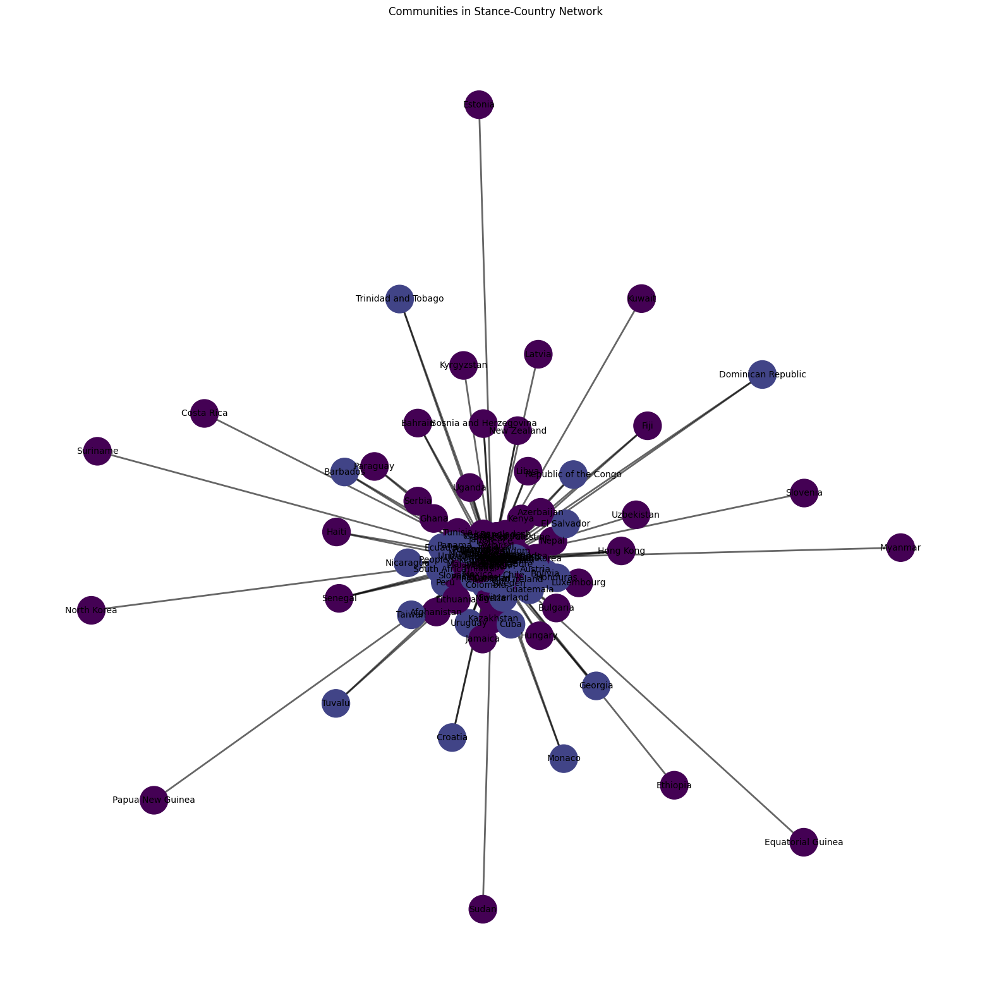


Regional composition of communities:
----------------------------------
Community 0 countries by region:
  South America: 4 countries (100.0%)

Community 1 countries by region:
  South America: 7 countries (100.0%)



In [15]:
# Create a projection of the graph focusing on stance-country relationships
import networkx as nx
import matplotlib.pyplot as plt
import matplotlib.cm as cm
import numpy as np
from collections import Counter

# Create a graph with only stances and countries
stance_country_graph = nx.Graph()

# Add nodes
stance_country_graph.add_nodes_from(stances, node_type='stance')
stance_country_graph.add_nodes_from(countries, node_type='country')

# Add edges with weights based on the number of tweets
for index, row in df.iterrows():
    stance = row['stance']
    country = row['country']
    
    # Add edge or update weight if it already exists
    if stance_country_graph.has_edge(stance, country):
        stance_country_graph[stance][country]['weight'] += 1
    else:
        stance_country_graph.add_edge(stance, country, weight=1)

# Calculate edge weights based on tweet probabilities (entail_prob and contra_prob)
# Optional: This can give more nuanced relationships
for index, row in df.iterrows():
    stance = row['stance']
    country = row['country']
    entail_prob = row['entail_prob']
    contra_prob = row['contra_prob']
    
    # Update edge weight with probability information
    if 'prob_sum' not in stance_country_graph[stance][country]:
        stance_country_graph[stance][country]['prob_sum'] = 0
    
    # You can adjust how you use these probabilities
    stance_country_graph[stance][country]['prob_sum'] += entail_prob - contra_prob

# Apply community detection to this projected graph
communities = nx.algorithms.community.louvain_communities(stance_country_graph)

# Convert communities to a partition dictionary
partition = {}
for i, community in enumerate(communities):
    for node in community:
        partition[node] = i

num_communities = len(communities)
print(f"Detected {num_communities} communities in the stance-country projection")

# Create a dictionary to store nodes in each community
communities_dict = {}
for i, community in enumerate(communities):
    communities_dict[i] = list(community)

# Analyze the communities
for community_id, nodes in communities_dict.items():
    # Count node types in this community
    stance_nodes = [node for node in nodes if stance_country_graph.nodes[node].get('node_type') == 'stance']
    country_nodes = [node for node in nodes if stance_country_graph.nodes[node].get('node_type') == 'country']
    
    print(f"Community {community_id}: {len(nodes)} nodes ({len(stance_nodes)} stances, {len(country_nodes)} countries)")
    print("  Stances:", stance_nodes)
    
    # Group countries by region for more insightful analysis
    countries_by_region = {}
    for country in country_nodes:
        # Find the region of this country from the original dataframe
        country_rows = df[df['country'] == country]
        if not country_rows.empty:
            region = country_rows.iloc[0]['region']
            if region not in countries_by_region:
                countries_by_region[region] = []
            countries_by_region[region].append(country)
    
    # Print countries grouped by region
    for region, region_countries in countries_by_region.items():
        print(f"  {region} ({len(region_countries)} countries): {region_countries}")
    
    print()

# Visualize the communities
plt.figure(figsize=(20, 20))

# Create a layout for the graph
pos = nx.spring_layout(stance_country_graph, seed=42)

# Draw nodes with colors based on communities
node_colors = [cmap(partition[node]) for node in stance_country_graph.nodes()]

# Use different shapes for stances and countries
node_shapes = []
node_sizes = []
for node in stance_country_graph.nodes():
    if node in stances:
        node_shapes.append('s')  # Square for stances
        node_sizes.append(2000)  # Larger for stances
    else:
        node_shapes.append('o')  # Circle for countries
        node_sizes.append(1000)  # Smaller for countries

# Draw the graph with different node shapes
for shape in set(node_shapes):
    # Get indices of nodes with this shape
    indices = [i for i, s in enumerate(node_shapes) if s == shape]
    nodes = [list(stance_country_graph.nodes())[i] for i in indices]
    
    # Get colors and sizes for these nodes
    colors = [node_colors[i] for i in indices]
    sizes = [node_sizes[i] for i in indices]
    
    # Draw these nodes
    nx.draw_networkx_nodes(stance_country_graph, pos, 
                          nodelist=nodes, 
                          node_color=colors,
                          node_shape=shape,
                          node_size=sizes)

# Draw edges with width based on weight
edge_weights = [stance_country_graph[u][v].get('weight', 1) for u, v in stance_country_graph.edges()]
max_weight = max(edge_weights)
normalized_weights = [2 + 3 * (w / max_weight) for w in edge_weights]

nx.draw_networkx_edges(stance_country_graph, pos, width=normalized_weights, alpha=0.6)
nx.draw_networkx_labels(stance_country_graph, pos, font_size=10)

plt.title("Communities in Stance-Country Network")
plt.axis('off')
plt.savefig("data/Clean_Data/stance_country_communities.png")
plt.show()

# Additional analysis: Measure how much communities align with regions
print("\nRegional composition of communities:")
print("----------------------------------")

for community_id, nodes in communities_dict.items():
    country_nodes = [node for node in nodes if stance_country_graph.nodes[node].get('node_type') == 'country']
    if not country_nodes:
        continue
        
    # Get regions for these countries
    country_regions = {}
    for country in country_nodes:
        country_rows = df[df['country'] == country]
        if not country_rows.empty:
            region = country_rows.iloc[0]['region']
            country_regions[country] = region
    
    # Count countries by region
    regions_count = Counter(country_regions.values())
    total_countries = len(country_nodes)
    
    print(f"Community {community_id} countries by region:")
    for region, count in regions_count.most_common():
        percentage = (count / total_countries) * 100
        print(f"  {region}: {count} countries ({percentage:.1f}%)")
    
    # Calculate regional diversity index (normalized entropy)
    if len(regions_count) > 1:
        entropy = 0
        for count in regions_count.values():
            p = count / total_countries
            entropy -= p * np.log(p)
        max_entropy = np.log(len(regions_count))
        normalized_entropy = entropy / max_entropy
        print(f"  Regional diversity index: {normalized_entropy:.2f} (0=homogeneous, 1=diverse)")
    print()

# Machine Learning

In [30]:
from sklearn.cluster import KMeans

k = 3 
embedding_df.columns = embedding_df.columns.astype(str)
kmeans = KMeans(n_clusters=k, random_state=42)
labels = kmeans.fit_predict(embedding_df)

# Add cluster labels to the embedding dataframe
embedding_df['kmeans_cluster'] = labels

/Library/Frameworks/Python.framework/Versions/3.11/lib/python3.11/site-packages/sklearn/cluster/_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


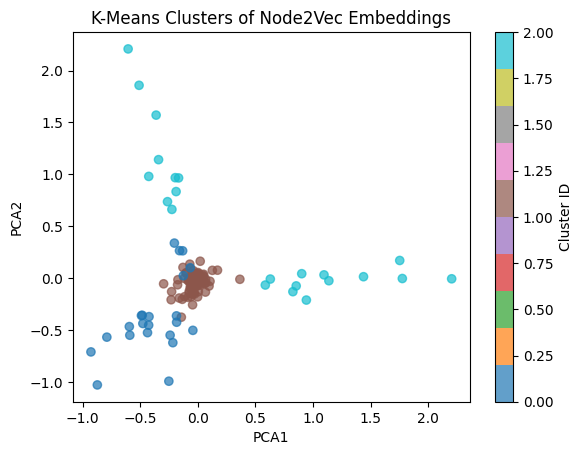

In [31]:
import matplotlib.pyplot as plt
from sklearn.decomposition import PCA

# Reduce dimensions for plotting
pca = PCA(n_components=2)
reduced = pca.fit_transform(embedding_df.drop(columns=["kmeans_cluster"]))

plt.scatter(reduced[:, 0], reduced[:, 1], c=embedding_df['kmeans_cluster'], cmap='tab10', alpha=0.7)
plt.title("K-Means Clusters of Node2Vec Embeddings")
plt.xlabel("PCA1")
plt.ylabel("PCA2")
plt.colorbar(label="Cluster ID")
plt.show()

In [32]:
# Print the nodes in each cluster
for cluster_id in range(k):
    cluster_nodes = embedding_df[embedding_df['kmeans_cluster'] == cluster_id].index.tolist()
    print(f"Cluster {cluster_id} ({len(cluster_nodes)} nodes):")
    print(cluster_nodes)
    print("-" * 50)

Cluster 0 (22 nodes):
['Latvia', 'Libya', 'Kuwait', 'Bulgaria', 'Slovenia', 'Tuvalu', 'Hungary', 'Austria', 'Luxembourg', 'Monaco', 'Fiji', 'Croatia', 'Bosnia and Herzegovina', 'New Zealand', 'Georgia', 'Estonia', 'Serbia', 'Papua New Guinea', 'Sudan', 'Europe', 'Middle East', 'Oceania']
--------------------------------------------------
Cluster 1 (81 nodes):
['unsure', 'pro-Ukraine', 'pro-Russia', 'Slovakia', 'Italy', 'India', 'Czech Republic', 'France', 'Ukraine', 'Nepal', 'Japan', 'United States of America', 'Azerbaijan', 'South Korea', 'Saudi Arabia', 'United Arab Emirates', 'Turkey', 'Qatar', 'Israel', 'Egypt', 'Lebanon', 'State of Palestine', "People's Republic of China", 'Germany', 'Algeria', 'Morocco', 'Tunisia', 'Iraq', 'United Kingdom', 'Syria', 'Iran', 'Bahrain', 'Australia', 'Singapore', 'Pakistan', 'Canada', 'Malaysia', 'Philippines', 'Afghanistan', 'Argentina', 'Portugal', 'Brazil', 'Chile', 'Mexico', 'Spain', 'Finland', 'Thailand', 'Denmark', 'Norway', 'Sweden', 'Lithuan